In [1]:
import pandas as pd
from sklearn.decomposition import PCA
import jax
import jax.numpy as jnp
from main_functions.DHT import dataDHT
from main_functions.utils import NormalizeData
from main_functions.plots import plot_mnist, plot_alldigits, plot_PCA2D, plot_PCA3D
import mne
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, classification_report
from sklearn.svm import SVC

#### References ####
#https://mindbigdata.com/opendb/visualmnist.html
#https://huggingface.co/datasets/DavidVivancos/MindBigData2022
#https://arxiv.org/pdf/2212.14746.pdf (original paper)
#https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=9616192
#https://doi.org/10.1016/j.neucom.2024.127654
#https://arxiv.org/pdf/2207.12369.pdf
#https://arxiv.org/pdf/1911.12152.pdf
#https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=9616192
#https://www.emerald.com/insight/content/doi/10.1108/IJQRM-07-2021-0237/full/pdf?title=quality-analysis-for-reliable-complex-multiclass-neuroscience-signal-classification-via-electroencephalography


In [2]:
path = "/home/natalia/Git_Projects/PhD/data/"
train_mnist = pd.read_csv(path+"train.csv")
test_mnist = pd.read_csv(path+"test.csv")

In [3]:
train_mnist

,label,label_image_x0_y0,label_image_x1_y0,label_image_x2_y0,label_image_x3_y0,label_image_x4_y0,label_image_x5_y0,label_image_x6_y0,label_image_x7_y0,label_image_x8_y0,...,CB2-390,CB2-391,CB2-392,CB2-393,CB2-394,CB2-395,CB2-396,CB2-397,CB2-398,CB2-399
0,-1,0,0,0,0,0,0,0,0,0,...,23.01493,23.87123,22.85085,19.85566,15.79527,12.49370,9.55881,7.59593,6.58291,4.68130
1,-1,0,0,0,0,0,0,0,0,0,...,7.98847,12.19635,13.66590,13.02032,8.19412,2.37598,-0.51995,-2.66001,-3.70420,-2.51486
2,-1,0,0,0,0,0,0,0,0,0,...,6.99310,2.91330,0.70500,-1.38109,-1.94454,-1.79613,-2.53922,-4.45836,-6.04761,-5.29638
3,7,0,0,0,0,0,0,0,0,0,...,26.11633,19.51793,14.32878,7.95443,2.33052,0.49308,-2.52386,-3.14282,-2.78172,-1.83404
4,-1,0,0,0,0,0,0,0,0,0,...,-5.39274,-1.42010,1.13587,3.32603,3.81115,2.82687,0.14266,-2.06796,-2.76734,-2.39403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1856,6,0,0,0,0,0,0,0,0,0,...,-23.33072,-19.28771,-15.08968,-10.76441,-7.93674,-6.59115,-6.71874,-7.50456,-7.47184,-6.06093
1857,-1,0,0,0,0,0,0,0,0,0,...,-34.88917,-31.72390,-25.71373,-20.17826,-17.73985,-15.76366,-15.37363,-16.02974,-16.04099,-13.85118
1858,7,0,0,0,0,0,0,0,0,0,...,0.03197,-3.23239,-5.48542,-6.31713,-5.42118,-4.06258,-3.57925,-3.64534,-3.50709,-2.84662
1859,-1,0,0,0,0,0,0,0,0,0,...,-11.36042,-10.34357,-9.16267,-7.43856,-5.10062,-3.80219,-2.74933,-1.53105,-1.01216,-0.31844


In [3]:
test_mnist

,label,label_image_x0_y0,label_image_x1_y0,label_image_x2_y0,label_image_x3_y0,label_image_x4_y0,label_image_x5_y0,label_image_x6_y0,label_image_x7_y0,label_image_x8_y0,...,CB2-390,CB2-391,CB2-392,CB2-393,CB2-394,CB2-395,CB2-396,CB2-397,CB2-398,CB2-399
0,-1,0,0,0,0,0,0,0,0,0,...,-5.36141,-3.29781,-2.75583,-1.79635,-0.52961,0.26373,1.96044,3.46439,3.90101,3.20109
1,-1,0,0,0,0,0,0,0,0,0,...,-9.69491,-10.06056,-10.08897,-11.05728,-12.06404,-12.58106,-12.93224,-11.87327,-9.78430,-6.61700
2,-1,0,0,0,0,0,0,0,0,0,...,8.79996,4.12753,0.00173,-3.66358,-6.29277,-8.33529,-9.17089,-7.83882,-6.15060,-4.06152
3,-1,0,0,0,0,0,0,0,0,0,...,44.74703,35.74668,26.56410,20.38838,18.39398,16.23916,15.96631,16.21026,15.11644,11.41007
4,-1,0,0,0,0,0,0,0,0,0,...,17.02249,13.30738,8.13123,4.89273,2.81720,3.44412,5.72844,8.47079,9.94543,8.21421
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
466,9,0,0,0,0,0,0,0,0,0,...,-7.97336,-7.40540,-6.94048,-6.82531,-6.38968,-6.25912,-5.43580,-3.50748,-2.05845,-0.81500
467,-1,0,0,0,0,0,0,0,0,0,...,-1.28638,0.19634,2.54234,5.14452,6.33306,5.21781,3.17423,0.98739,-0.50772,-0.69227
468,-1,0,0,0,0,0,0,0,0,0,...,9.43896,6.83258,4.01367,1.36326,-1.89604,-3.87419,-3.47444,-2.21768,-0.20782,0.70943
469,8,0,0,0,0,0,0,0,0,0,...,-2.24667,-2.41551,-2.26052,-3.79380,-6.74507,-9.67219,-11.57059,-11.48253,-9.58346,-6.27142


In [24]:
# ignoring the images
filtered_columns = [col for col in train_mnist.columns if not col.startswith('label_image')]
filtered_df = train_mnist[filtered_columns]

In [25]:
filtered_df

,label,FP1-0,FP1-1,FP1-2,FP1-3,FP1-4,FP1-5,FP1-6,FP1-7,FP1-8,...,CB2-390,CB2-391,CB2-392,CB2-393,CB2-394,CB2-395,CB2-396,CB2-397,CB2-398,CB2-399
0,-1,-3.20215,-11.65116,-22.81307,-30.24257,-29.48354,-29.30174,-24.38044,-18.83731,-12.05837,...,23.01493,23.87123,22.85085,19.85566,15.79527,12.49370,9.55881,7.59593,6.58291,4.68130
1,-1,-3.08646,-11.57165,-21.39792,-25.90062,-23.89881,-19.25701,-14.10636,-8.96126,-3.15419,...,7.98847,12.19635,13.66590,13.02032,8.19412,2.37598,-0.51995,-2.66001,-3.70420,-2.51486
2,-1,-3.43736,-13.55384,-27.29921,-35.65671,-33.57147,-25.74545,-15.55962,-8.46612,-6.38887,...,6.99310,2.91330,0.70500,-1.38109,-1.94454,-1.79613,-2.53922,-4.45836,-6.04761,-5.29638
3,7,1.29715,4.09874,9.70426,15.74990,19.98019,23.19886,26.74464,30.90584,34.56394,...,26.11633,19.51793,14.32878,7.95443,2.33052,0.49308,-2.52386,-3.14282,-2.78172,-1.83404
4,-1,-4.01201,-15.43636,-30.62967,-42.36686,-45.15632,-44.09347,-40.95648,-35.37350,-28.56159,...,-5.39274,-1.42010,1.13587,3.32603,3.81115,2.82687,0.14266,-2.06796,-2.76734,-2.39403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1856,6,-2.43326,-7.19954,-11.21054,-10.71535,-4.88116,6.02516,16.02894,25.56574,34.21298,...,-23.33072,-19.28771,-15.08968,-10.76441,-7.93674,-6.59115,-6.71874,-7.50456,-7.47184,-6.06093
1857,-1,-3.83699,-14.75597,-28.44392,-36.67583,-35.17211,-33.09313,-27.41227,-21.55756,-14.78793,...,-34.88917,-31.72390,-25.71373,-20.17826,-17.73985,-15.76366,-15.37363,-16.02974,-16.04099,-13.85118
1858,7,-1.97071,-6.44727,-12.83994,-14.70773,-13.21836,-5.83879,2.18621,8.64500,13.08993,...,0.03197,-3.23239,-5.48542,-6.31713,-5.42118,-4.06258,-3.57925,-3.64534,-3.50709,-2.84662
1859,-1,-2.21280,-8.17103,-15.92289,-19.65783,-18.27197,-13.23219,-5.87751,1.51967,7.37222,...,-11.36042,-10.34357,-9.16267,-7.43856,-5.10062,-3.80219,-2.74933,-1.53105,-1.01216,-0.31844


In [6]:
# selecting electrodes/channels
a = ('label', 'O1', 'Oz', 'O2', 'POz', 'Pz', 'PO3', 'PO4',
     'PO7', 'PO8', 'P1', 'P2', 'Cz', 'C1', 'C2', 'CPz', 'FCz')

b = ('label', 'FP1', 'FP2', 'FPz', 'AF3', 'AFz', 'AF4', 'F7', 
     'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FC5',
     'FC3', 'FC1', 'FCz')
filtered_channel = [col for col in filtered_df.columns if col.startswith(b)]
channel_df = filtered_df[filtered_channel]

In [7]:
channel_df

,label,FP1-0,FP1-1,FP1-2,FP1-3,FP1-4,FP1-5,FP1-6,FP1-7,FP1-8,...,FCz-390,FCz-391,FCz-392,FCz-393,FCz-394,FCz-395,FCz-396,FCz-397,FCz-398,FCz-399
0,-1,-3.20215,-11.65116,-22.81307,-30.24257,-29.48354,-29.30174,-24.38044,-18.83731,-12.05837,...,16.28999,12.12643,8.62678,6.03425,3.48040,2.81920,2.99101,3.52743,4.45468,3.44693
1,-1,-3.08646,-11.57165,-21.39792,-25.90062,-23.89881,-19.25701,-14.10636,-8.96126,-3.15419,...,-6.17124,-4.29646,-4.78648,-6.58089,-12.86547,-18.40900,-19.29464,-18.01592,-11.64440,-6.97785
2,-1,-3.43736,-13.55384,-27.29921,-35.65671,-33.57147,-25.74545,-15.55962,-8.46612,-6.38887,...,-11.69465,-10.12376,-7.70017,-5.65644,-3.15115,-0.33603,0.66256,0.65856,0.64144,0.27151
3,7,1.29715,4.09874,9.70426,15.74990,19.98019,23.19886,26.74464,30.90584,34.56394,...,9.44350,9.21199,7.91461,4.16734,-0.18357,-1.14937,-2.73827,-1.90841,-0.69157,-0.01303
4,-1,-4.01201,-15.43636,-30.62967,-42.36686,-45.15632,-44.09347,-40.95648,-35.37350,-28.56159,...,3.71193,4.99159,7.27763,8.26148,6.86447,2.89628,-0.89366,-3.08153,-4.25785,-3.70028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1856,6,-2.43326,-7.19954,-11.21054,-10.71535,-4.88116,6.02516,16.02894,25.56574,34.21298,...,-12.71471,-12.95853,-11.26068,-6.69146,-1.78521,0.03815,1.97618,0.70896,-1.47713,-2.16197
1857,-1,-3.83699,-14.75597,-28.44392,-36.67583,-35.17211,-33.09313,-27.41227,-21.55756,-14.78793,...,-32.16321,-27.17757,-22.15808,-16.50289,-13.40247,-11.54797,-9.72921,-8.53768,-7.38173,-5.63624
1858,7,-1.97071,-6.44727,-12.83994,-14.70773,-13.21836,-5.83879,2.18621,8.64500,13.08993,...,-0.31666,-3.28616,-3.60141,-2.37110,3.41507,8.13335,9.22573,9.08170,6.09595,3.17111
1859,-1,-2.21280,-8.17103,-15.92289,-19.65783,-18.27197,-13.23219,-5.87751,1.51967,7.37222,...,11.95562,12.84558,12.39403,9.01300,3.56655,0.11875,-1.62630,-2.22877,-1.90214,-0.90959


In [8]:
# selecting one electrode/channel

f_channel = [col for col in channel_df.columns if col.startswith(('label', 'FCz'))]
fchannel_df = channel_df[f_channel]

In [9]:
# getting the first example of each class
digit_examples = fchannel_df.groupby('label').first()
digit_examples

,FCz-0,FCz-1,FCz-2,FCz-3,FCz-4,FCz-5,FCz-6,FCz-7,FCz-8,FCz-9,...,FCz-390,FCz-391,FCz-392,FCz-393,FCz-394,FCz-395,FCz-396,FCz-397,FCz-398,FCz-399
label,,,,,,,,,,,,,,,,,,,,,
-1,2.76984,6.19059,8.78797,11.61165,11.89648,10.93181,9.32502,7.82207,8.39850,11.44996,...,16.28999,12.12643,8.62678,6.03425,3.48040,2.81920,2.99101,3.52743,4.45468,3.44693
0,-1.27220,-3.24345,-7.22947,-12.24396,-16.28656,-19.09321,-20.66133,-20.79426,-19.14084,-16.42613,...,9.89635,8.71997,5.02227,0.07310,-2.37432,-4.23883,-3.61782,-1.71069,0.48173,1.32828
1,-3.24951,-6.09735,-8.45009,-10.05901,-10.29744,-10.59016,-12.14650,-16.06987,-22.68522,-24.82344,...,-30.00350,-24.74328,-17.88462,-11.60112,-7.37257,-6.89184,-6.68624,-7.27926,-7.21618,-5.66531
2,-10.27486,-22.01379,-35.15082,-44.64337,-50.24939,-48.08897,-45.23070,-39.82468,-33.98181,-28.21432,...,4.81124,2.84157,1.14431,-0.63166,-1.53344,-1.21906,-0.21333,2.26390,4.24868,3.57752
3,-0.60116,-2.14061,-4.16423,-6.29068,-8.19467,-8.13545,-7.18666,-5.53136,-3.74084,-3.72061,...,10.23908,6.61758,3.61887,2.48968,1.87987,3.56136,5.02994,5.82138,6.29816,4.73663
4,2.82955,5.73633,8.83255,12.27563,13.30795,12.78081,9.39246,4.06045,-3.03088,-8.97851,...,-14.68064,-13.25305,-9.56051,-4.61661,-1.16441,0.64910,1.68147,0.55586,-0.84473,-1.28517
5,-1.38236,-2.52723,-4.56898,-5.90137,-6.64199,-6.23130,-4.41317,-1.88939,0.90031,3.41608,...,-7.45261,-8.67016,-9.52138,-8.81447,-7.81585,-6.26677,-4.24414,-3.21634,-2.64167,-1.88627
6,-2.67284,-5.96954,-7.73416,-9.91506,-9.60420,-7.55441,-5.05186,-4.33275,-3.71084,-4.59256,...,-16.60242,-17.50388,-14.91835,-9.00431,-3.87510,-0.16080,0.75163,1.65796,0.69500,0.22811
7,-0.64301,-0.09942,0.96721,3.17974,6.35380,11.55976,16.18311,21.02871,26.16598,31.87299,...,9.44350,9.21199,7.91461,4.16734,-0.18357,-1.14937,-2.73827,-1.90841,-0.69157,-0.01303


#### Signals plot

In [11]:
def filtro_CAR(X, axis=0):
  return X - np.mean(X,axis=axis,keepdims=True)

In [11]:
# plotting one example of all the digits together

label = jnp.array(digit_examples.index)
data = digit_examples
x = jnp.reshape(data.values, (1, 11, data.values.shape[1], 1))
x = filtro_CAR(x, axis=1)
dhtdata = jax.jit(dataDHT, device=jax.devices("cpu")[0])(x)

plot_alldigits(data=data, label=label, dhtdata=dhtdata)

In [13]:
for lbl in range(-1, 10):
    Oz_label = fchannel_df[fchannel_df["label"] == lbl].iloc[0]
    #print(Oz_label)
    data = Oz_label.drop("label")
    #print(data.values.shape)
    #print(data.values.shape)
    x = jnp.reshape(data.values, (1, 1, data.values.shape[0], 1))
    dhtdata = jax.jit(dataDHT, device=jax.devices("cpu")[0])(x)
    plot_mnist(data=data, label=Oz_label, dhtdata=dhtdata, sampling_frequency=200)

#### Scalp plots

In [6]:
df = filtered_df.drop(columns=["label"])
grouped_df = filtered_df.groupby('label').first()
labels = filtered_df["label"]
grouped_labels = jnp.array(grouped_df.index)

In [7]:
df.shape

(1861, 25600)

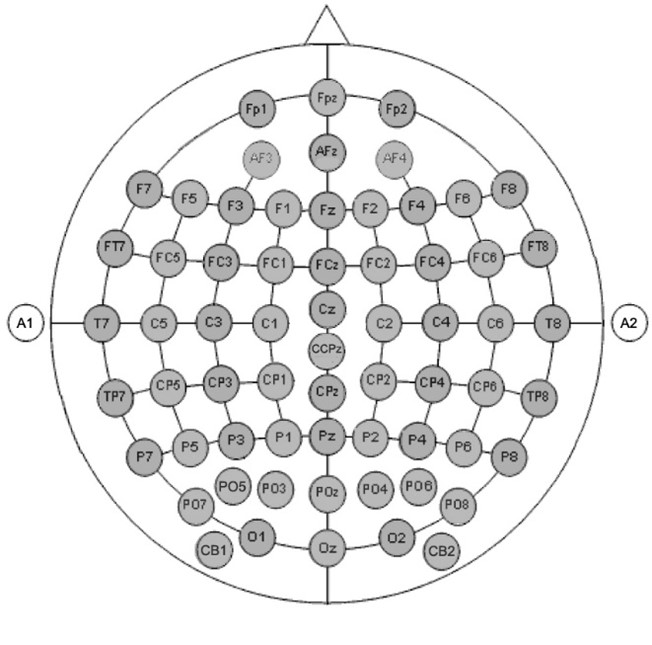

In [10]:
arraydata = jnp.array(df)
rsdata = filtro_CAR(arraydata.reshape(arraydata.shape[0], arraydata.shape[1]//400, -1, 1), axis=1)
rsdata.shape

(1861, 64, 400, 1)

In [11]:
topodata = rsdata[3].reshape(rsdata.shape[1], rsdata.shape[2])
ch_names = ['Fp1', 'FPz', 'Fp2', 'AF3', 'AFz', 'AF4', 'F7', 'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 
            'FT7', 'FC5', 'FC3', 'FC1', 'FCz', 'FC2', 'FC4', 'FC6', 'FT8', 'T7', 'C5', 'C3', 'C1', 'Cz', 
            'CCPz', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPz', 'CP2', 'CP4', 'CP6', 'TP8', 
            'P7', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POz', 'PO4', 'PO6', 
            'PO8', 'CB1', 'O1', 'Oz', 'O2', 'CB2']

topodata.shape

(64, 400)

Creating RawArray with float64 data, n_channels=64, n_times=400
    Range : 0 ... 399 =      0.000 ...     1.995 secs
Ready.


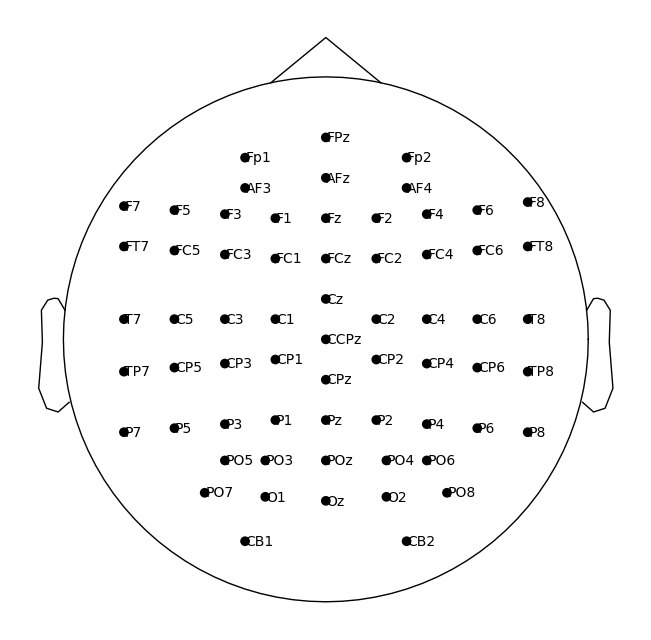

In [12]:
# Define approximate positions for 10-20 system based on normalized distances (-1 to 1)
electrode_positions = {
    'Fp1': [-0.4, 0.9, 0],
    'FPz': [0, 1.0, 0],
    'Fp2': [0.4, 0.9, 0],
    'AFz': [0, 0.8, 0],
    'AF3': [-0.4, 0.75, 0],
    'AF4': [0.4, 0.75, 0],
    'AF7': [-1, 0.5, 0],
    'AF8': [1, 0.5, 0],
    'F7': [-1, 0.66, 0],
    'F5': [-0.75, 0.64, 0],
    'F3': [-0.5, 0.62, 0],
    'F1': [-0.25, 0.6, 0],
    'Fz': [0, 0.6, 0],
    'F2': [0.25, 0.6, 0],
    'F4': [0.5, 0.62, 0],
    'F6': [0.75, 0.64, 0],
    'F8': [1, 0.68, 0],
    'FT7': [-1, 0.46, 0],
    'FC5': [-0.75, 0.44, 0],
    'FC3': [-0.5, 0.42, 0],
    'FC1': [-0.25, 0.4, 0],
    'FCz': [0, 0.4, 0],
    'FC2': [0.25, 0.4, 0],
    'FC4': [0.5, 0.42, 0],
    'FC6': [0.75, 0.44, 0],
    'FT8': [1, 0.46, 0],
    'T7': [-1, 0.1, 0],
    'C5': [-0.75, 0.1, 0],
    'C3': [-0.5, 0.1, 0],
    'C1': [-0.25, 0.1, 0],
    'Cz': [0, 0.2, 0],
    'CCPz': [0, 0, 0],
    'C2': [0.25, 0.1, 0],
    'C4': [0.5, 0.1, 0],
    'C6': [0.75, 0.1, 0],
    'T8': [1, 0.1, 0],
    'TP7': [-1, -0.16, 0],
    'CP5': [-0.75, -0.14, 0],
    'CP3': [-0.5, -0.12, 0],
    'CP1': [-0.25, -0.1, 0],
    'CPz': [0, -0.2, 0],
    'CP2': [0.25, -0.1, 0],
    'CP4': [0.5, -0.12, 0],
    'CP6': [0.75, -0.14, 0],
    'TP8': [1, -0.16, 0],
    'P7': [-1, -0.46, 0],
    'P5': [-0.75, -0.44, 0],
    'P3': [-0.5, -0.42, 0],
    'P1': [-0.25, -0.4, 0],
    'Pz': [0, -0.4, 0],
    'P2': [0.25, -0.4, 0],
    'P4': [0.5, -0.42, 0],
    'P6': [0.75, -0.44, 0],
    'P8': [1, -0.46, 0],
    'PO7': [-0.6, -0.76, 0],
    'PO3': [-0.3, -0.6, 0],
    'PO5': [-0.5, -0.6, 0],
    'POz': [0, -0.6, 0],
    'PO4': [0.3, -0.6, 0],
    'PO6': [0.5, -0.6, 0],
    'PO8': [0.6, -0.76, 0],
    'O1': [-0.3, -0.78, 0],
    'Oz': [0, -0.8, 0],
    'O2': [0.3, -0.78, 0],
    'CB1': [-0.4, -1.0, 0],
    'CB2': [0.4, -1.0, 0],
}

# Create a DigMontage object
custom_montage = mne.channels.make_dig_montage(
    ch_pos=dict(zip(ch_names, [electrode_positions[ch] for ch in ch_names])),
    coord_frame='head'
)

# Create info object
info = mne.create_info(ch_names=ch_names, sfreq=200, ch_types=['eeg'] * len(ch_names))

# Set the custom montage
info.set_montage(custom_montage)
# Create RawArray object
ch_type='eeg'
raw = mne.io.RawArray(topodata, info).plot_sensors(kind='topomap', sphere=1.3, show_names=True, ch_type=ch_type, show=True)  # Plot sensor locations
plt.show()

In [13]:
dht_rsdata = jax.jit(dataDHT, device=jax.devices("cpu")[0])(rsdata) #(x, 64, 400, 1)
dht_topodata = dht_rsdata[3].reshape(dht_rsdata.shape[1], dht_rsdata.shape[2]) #(64, 400)
normdht_topodata = NormalizeData(dht_topodata, axis=1) #(64,400)

avgdht_topodata = dht_rsdata.mean(axis=0).reshape(dht_rsdata.shape[1], dht_rsdata.shape[2])
avg_topodata = rsdata.mean(axis=0).reshape(rsdata.shape[1], rsdata.shape[2])
normavgdht_topodata = NormalizeData(dht_rsdata.mean(axis=0), axis=1).reshape(dht_rsdata.shape[1], dht_rsdata.shape[2])
normavg_topodata = NormalizeData(rsdata.mean(axis=0), axis=1).reshape(rsdata.shape[1], rsdata.shape[2])

Creating RawArray with float64 data, n_channels=64, n_times=400
    Range : 0 ... 399 =      0.000 ...     1.995 secs
Ready.


Using matplotlib as 2D backend.


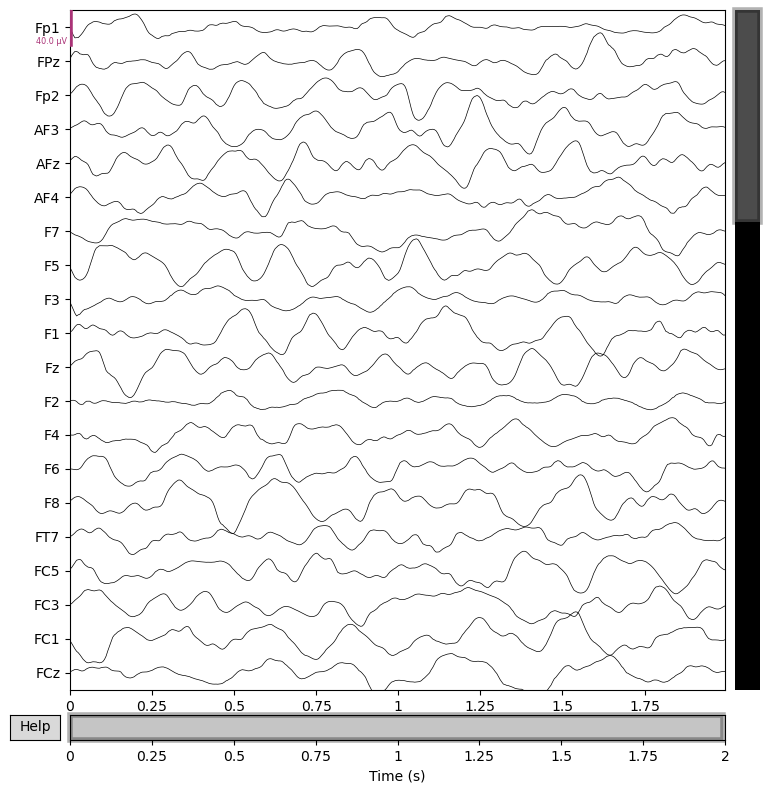

In [22]:
#mne.set_config('MNE_BROWSER_BACKEND', 'matplotlib')
#%matplotlib qt
#mne.viz.use_browser_backend('matplotlib')
rraw = mne.io.RawArray(rsdata[0,:,:,0]/10**6.4, info).plot() #/10**6

Creating RawArray with float64 data, n_channels=64, n_times=400
    Range : 0 ... 399 =      0.000 ...     1.995 secs
Ready.
Effective window size : 2.000 (s)
Plotting power spectral density (dB=True).


/tmp/ipykernel_471535/3750915357.py:2: FutureWarning:

The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.

/home/natalia/miniforge-pypy3/envs/PhD_test/lib/python3.12/site-packages/mne/viz/utils.py:167: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



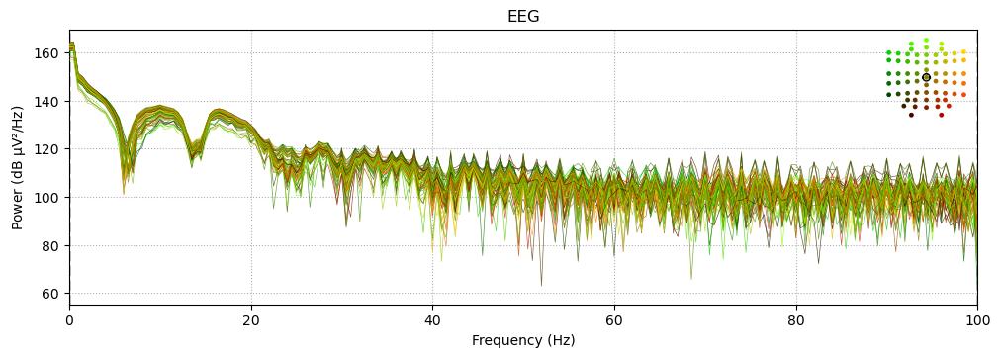

In [23]:
#%matplotlib qt
r = mne.io.RawArray(avgdht_topodata[:,:], info).compute_psd().plot()

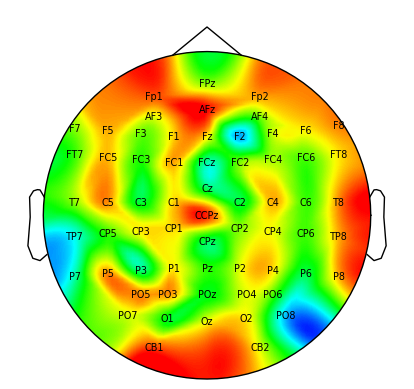

In [24]:
data = avgdht_topodata #64,400

fs = 200 #sampling_frequency  # Hz
time = jnp.arange(data.shape[1]) / fs
frequency = jnp.arange(0,data.shape[1]) * (fs/data.shape[1])

# Plot topographic map
f = 10 #Hz
fig, ax = plt.subplots()
mne.viz.plot_topomap(data[:,int(jnp.argmax(frequency == f))].reshape(64,), info, axes=ax, sensors=False, names=ch_names, 
                     show=False, sphere=1.24, ch_type="eeg", contours=False, cmap='hsv_r')#'RdBu_r'
plt.show()

(1861, 64, 400, 1)
-1


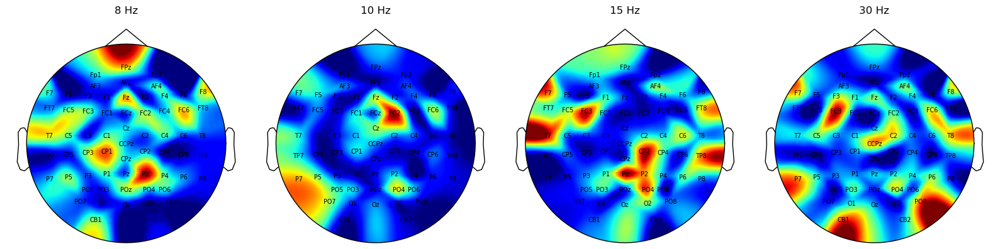

0


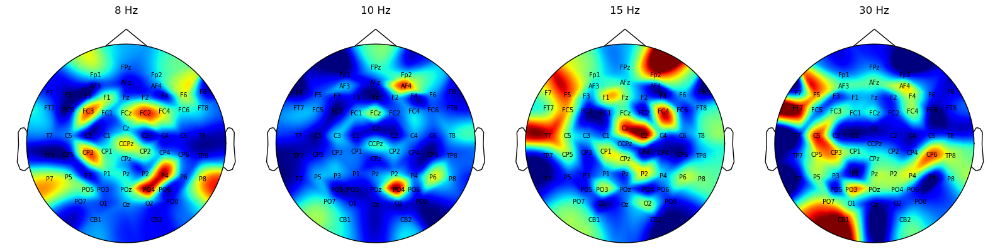

1


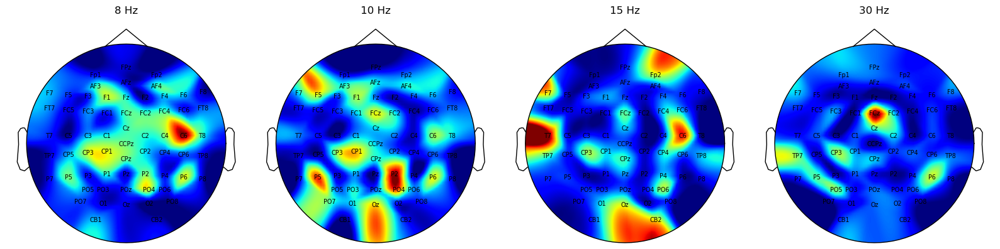

2


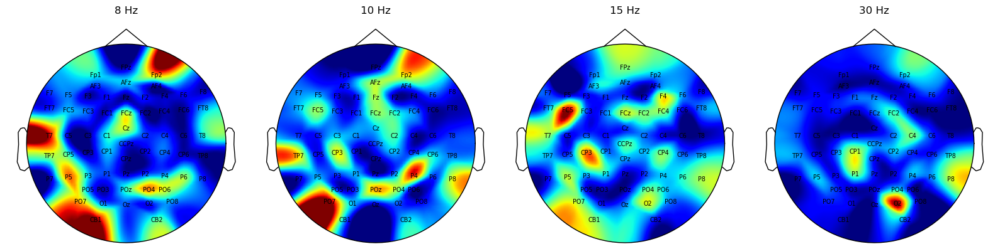

3


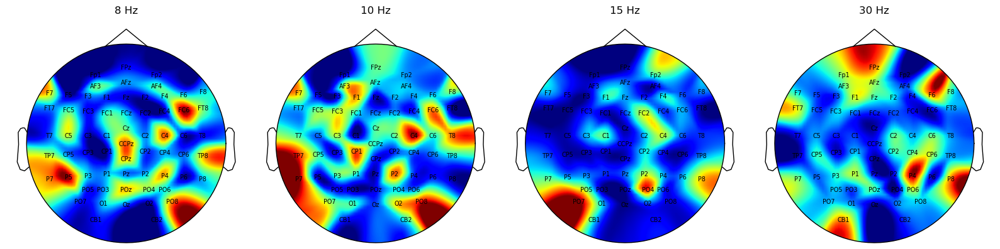

4


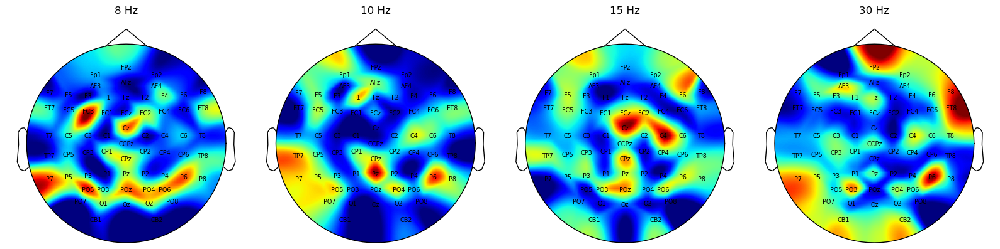

5


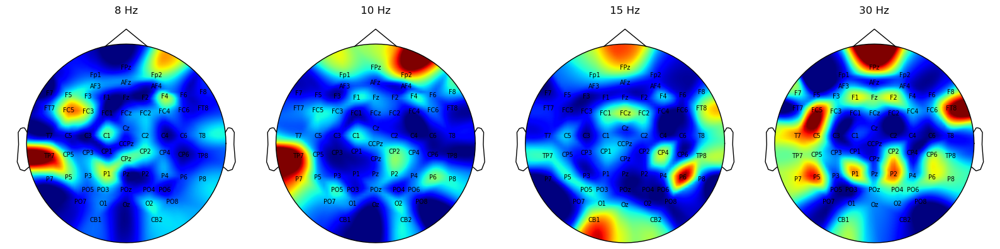

6


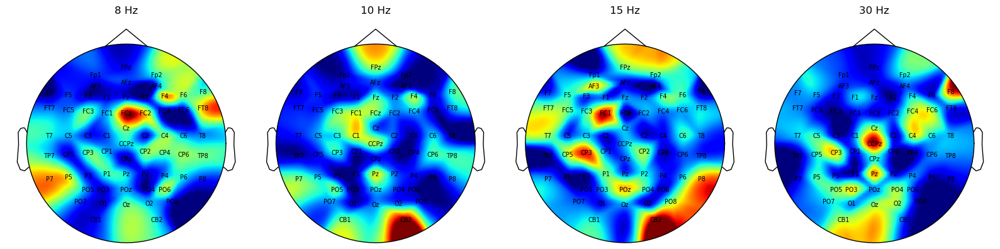

7


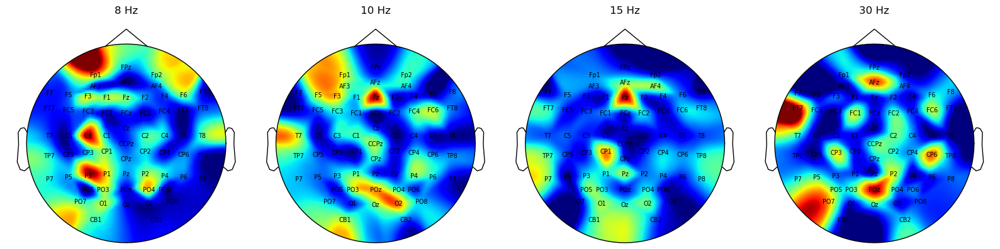

8


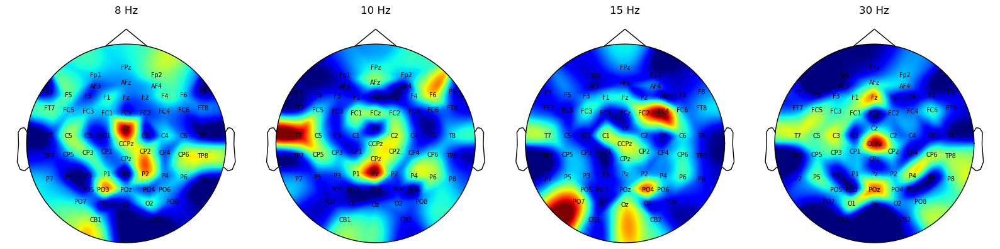

9


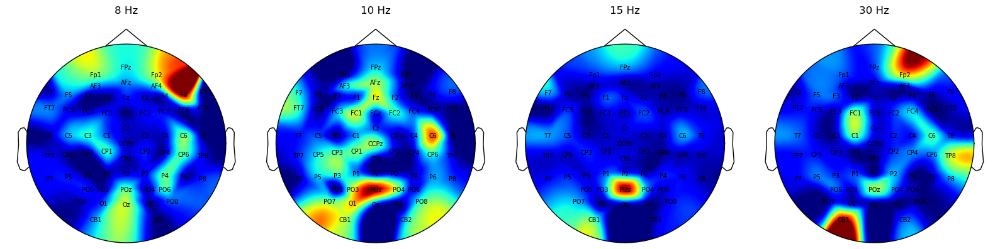

In [25]:
garraydata = jnp.array(grouped_df)
grsdata = filtro_CAR(arraydata.reshape(arraydata.shape[0], arraydata.shape[1]//400, -1, 1), axis=1)
print(grsdata.shape)

dht_grsdata = jax.jit(dataDHT, device=jax.devices("cpu")[0])(grsdata) #(x, 64, 400, 1)


data = dht_grsdata # Your data array (shape: 64, 400)
fs = 200  # Sampling frequency (Hz)
time = np.arange(data.shape[2]) / fs
frequency = np.arange(0, data.shape[2]) * (fs / data.shape[2])
#print(frequency)
# Frequencies of interest
frequencies = [8,10,15,30]

for label_idx, label in enumerate(grouped_labels):
    #label_idx = int(jnp.argmax(grouped_labels == label))
    print(label)
    # Create subplots
    fig, axes = plt.subplots(1, 4, figsize=(16, 10))
    # Flatten axes for easy iteration
    axes = axes.flatten()
    # Plot topographic maps
    for i, f in enumerate(frequencies):
        #print(f)
        ax = axes[i]
        #f_index = np.argmin(np.abs(frequency - f))
        #f_index = int(jnp.argmax(frequency == f))
        #print(f_index)
        topo_data = data[label_idx, :, i, 0].reshape(64,)
        
        mne.viz.plot_topomap(topo_data, info, axes=ax, sensors=False, names=ch_names, 
                            show=False, sphere=1.3, ch_type="eeg", contours=False, cmap='jet')
        ax.set_title(f'{f} Hz')
    
    plt.tight_layout()
    
    plt.show()

In [ ]:
import plotly.express as px
for idx , f in enumerate(frequencies):
    fs = 200
    data = NormalizeData(dht_grsdata)[:,:,:dht_grsdata.shape[2]//2,:]
    frequency = jnp.arange(0,data.shape[2]) * (fs/data.shape[2])
    print(frequency.shape, data[idx,:,:,0].shape)
    fig = px.imshow(data[idx,:,:,0].T, #reshape(data.shape[2], data.shape[1]),
                    labels=dict(x="Frequency", y="Electrodes"), color_continuous_scale='jet',
                    x=ch_names,
                    y=frequency[:]
                )
    fig.update_xaxes(side="bottom")
    fig.update_layout(title=f'{f} Hz', height=500)
    fig.show()

In [22]:
# Plot topographic map using Plotly
fig = go.Figure()

data = dht_rsdata.mean(axis=0).reshape(dht_rsdata.shape[1], dht_rsdata.shape[2]) #normavgdht_topodata
print(data.shape)
fs = 200 #sampling_frequency  # Hz
time = jnp.arange(data.shape[1]) / fs
frequency = jnp.arange(0,data.shape[1]) * (fs/data.shape[1])
fig.add_trace(go.Heatmap(z=data, zmin=int(data.min()), zmax=int(data.max()), colorscale='jet',
                         x=ch_names,
                         y=frequency))

fig.update_layout(title=f'Topographic map of the dataset', xaxis_title='Electrodes', yaxis_title='Frequency (Hz)')

fig.show()

(64, 400)


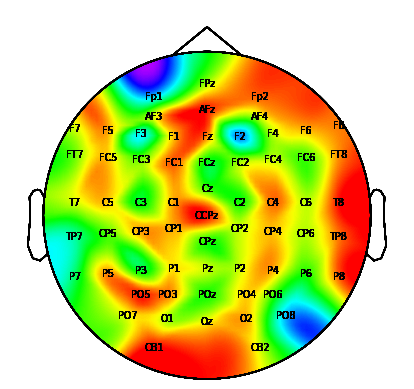

In [125]:
import matplotlib.pyplot as plt
# Plot topographic map
fig, ax = plt.subplots()
for i in range(0, len(avgdht_topodata[1]),10):
    mne.viz.plot_topomap(avgdht_topodata[:,i], info, axes=ax, sensors=False, names=ch_names, show=True, sphere=1.24, ch_type="eeg", contours=False, cmap='hsv_r')
    display(fig)
    clear_output(wait=True)
    plt.show()

#### Preparing a binary dataset

In [47]:
#getting data from labels 0 and 1
b_df = channel_df[channel_df['label'].isin([0,1])]

In [48]:
b_df

,label,FP1-0,FP1-1,FP1-2,FP1-3,FP1-4,FP1-5,FP1-6,FP1-7,FP1-8,...,FCz-390,FCz-391,FCz-392,FCz-393,FCz-394,FCz-395,FCz-396,FCz-397,FCz-398,FCz-399
17,1,-2.74854,-10.59159,-20.60592,-24.86778,-21.84833,-12.93593,-3.62383,3.38659,7.49795,...,-30.00350,-24.74328,-17.88462,-11.60112,-7.37257,-6.89184,-6.68624,-7.27926,-7.21618,-5.66531
18,0,-4.06285,-15.22858,-30.15984,-40.86074,-40.52872,-37.67717,-29.52500,-22.62080,-18.71365,...,9.89635,8.71997,5.02227,0.07310,-2.37432,-4.23883,-3.61782,-1.71069,0.48173,1.32828
60,1,-2.85472,-9.84848,-16.78414,-17.20301,-12.83977,-4.10977,4.16491,11.79569,19.93231,...,11.54849,10.85193,10.00727,7.85213,3.13388,-2.43648,-4.57516,-6.39081,-5.95806,-4.24561
61,1,-1.87363,-5.14567,-10.08606,-12.71549,-14.86314,-14.93833,-12.32081,-5.59558,4.10187,...,-8.52817,-6.60885,-4.18478,-3.19236,-3.69346,-5.07105,-6.66967,-6.95990,-5.62172,-3.52765
65,1,-2.67119,-9.89124,-19.75226,-24.38216,-21.98638,-14.12676,-5.66564,1.06354,6.62388,...,-11.09634,-5.60790,-4.10889,-3.34951,-5.12250,-7.44017,-8.46726,-7.66886,-4.67889,-2.84624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1806,0,-4.04566,-15.28996,-28.52155,-35.82188,-33.70126,-28.72698,-22.25727,-17.50373,-13.35533,...,-9.20664,-11.23718,-10.70270,-9.87786,-9.71776,-10.40025,-11.79647,-11.96749,-10.50191,-6.94738
1809,0,-3.24007,-12.02519,-22.56610,-27.64171,-25.55419,-20.98032,-15.59926,-11.45825,-8.00907,...,18.41959,13.65118,10.21361,7.05907,6.07423,6.28882,7.53611,8.04358,7.14460,5.21731
1834,0,-2.67675,-9.43389,-18.39172,-24.13906,-22.81331,-18.89590,-10.68767,-3.79018,0.30870,...,10.29052,10.46257,8.64772,6.30847,4.32451,3.29434,3.42989,4.45979,5.69320,4.44929
1846,1,-3.31014,-12.33224,-22.71266,-27.91698,-26.09300,-22.73356,-17.84904,-12.96092,-6.28948,...,-11.64792,-9.15582,-7.07757,-5.61171,-5.39986,-5.92669,-7.81606,-9.07781,-8.48464,-5.63176


In [50]:
# running PCA

# Assuming df is your DataFrame with shape (202, 25600)
# and labels is your labels array with shape (202,)
xdata = b_df.drop(columns=["label"]) #to plot
print(xdata.shape)
xdata_reshape = jnp.reshape(xdata.values, (xdata.values.shape[0], xdata.values.shape[1]//400, -1, 1))
print(xdata_reshape.shape)
x_dhtdata = NormalizeData(jax.jit(dataDHT, device=jax.devices("cpu")[0])(xdata_reshape)).reshape(xdata_reshape.shape[0], -1)
print(x_dhtdata.shape)
#t = x_dhtdata.reshape(x_dhtdata.shape[0], 16, -1)[0]
# Perform PCA
pca = PCA(n_components=5)
principal_components = pca.fit_transform(x_dhtdata)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

print("Explained variance ratio for each principal component:")
for i, evr in enumerate(explained_variance_ratio):
    print(f"PC{i+1}: {evr:.2f}")

total_explained_variance = jnp.sum(explained_variance_ratio)
print(f"\nTotal explained variance: {total_explained_variance:.2f}")

(202, 8000)
(202, 20, 400, 1)
(202, 8000)
Explained variance ratio for each principal component:
PC1: 0.01
PC2: 0.01
PC3: 0.01
PC4: 0.01
PC5: 0.01

Total explained variance: 0.06


In [72]:
plot_PCA2D(pcadata=principal_components[:,:2], labels=b_df['label'] ) #b_df['label']

ValueError: Length of values (202) does not match length of index (21)

In [162]:
plot_PCA3D(pcadata=principal_components[:,:3], labels=b_df['label'])

####  Running KNN

In [59]:
# Assuming x_dhtdata is your DataFrame with shape (202, 6400)
# And b_df['label'] is a Series or array with shape (202,)

# Convert to NumPy arrays
x_data = np.array(x_dhtdata)
labels = np.array(b_df['label'])

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_data, labels, test_size=0.1, random_state=42)

# Initialize KNN classifier
knn = KNeighborsClassifier(n_neighbors=4)

# Fit KNN model
knn.fit(x_train, y_train)

# Get predicted labels for test set
predicted_labels = knn.predict(x_test)
# Calculate accuracy
accuracy = accuracy_score(y_test, predicted_labels)
print("Accuracy:", accuracy)

# Perform PCA for visualization
pca = PCA(n_components=10)
principal_components = pca.fit_transform(x_test)

# Create figure
fig = go.Figure()

# Add scatter plot for each class
for label in np.unique(predicted_labels):
    data = principal_components[predicted_labels == label]
    fig.add_trace(go.Scatter(
        x=data[:, 0],
        y=data[:, 1],
        mode='markers',
        name=f'Cluster {label}'
    ))

# Set plot layout
fig.update_layout(
    title='Clusters from KNN on Test Set',
    xaxis=dict(title='Principal Component 1'),
    yaxis=dict(title='Principal Component 2')
)

# Show plot
fig.show()

Accuracy: 0.6666666666666666


#### Running SVM

In [26]:
filtered_df.loc[filtered_df['label'].between(0,9), 'label'] = 1
filtered_df.loc[filtered_df['label']==-1, 'label'] = 0
bin_df = filtered_df
bin_df

,label,FP1-0,FP1-1,FP1-2,FP1-3,FP1-4,FP1-5,FP1-6,FP1-7,FP1-8,...,CB2-390,CB2-391,CB2-392,CB2-393,CB2-394,CB2-395,CB2-396,CB2-397,CB2-398,CB2-399
0,0,-3.20215,-11.65116,-22.81307,-30.24257,-29.48354,-29.30174,-24.38044,-18.83731,-12.05837,...,23.01493,23.87123,22.85085,19.85566,15.79527,12.49370,9.55881,7.59593,6.58291,4.68130
1,0,-3.08646,-11.57165,-21.39792,-25.90062,-23.89881,-19.25701,-14.10636,-8.96126,-3.15419,...,7.98847,12.19635,13.66590,13.02032,8.19412,2.37598,-0.51995,-2.66001,-3.70420,-2.51486
2,0,-3.43736,-13.55384,-27.29921,-35.65671,-33.57147,-25.74545,-15.55962,-8.46612,-6.38887,...,6.99310,2.91330,0.70500,-1.38109,-1.94454,-1.79613,-2.53922,-4.45836,-6.04761,-5.29638
3,1,1.29715,4.09874,9.70426,15.74990,19.98019,23.19886,26.74464,30.90584,34.56394,...,26.11633,19.51793,14.32878,7.95443,2.33052,0.49308,-2.52386,-3.14282,-2.78172,-1.83404
4,0,-4.01201,-15.43636,-30.62967,-42.36686,-45.15632,-44.09347,-40.95648,-35.37350,-28.56159,...,-5.39274,-1.42010,1.13587,3.32603,3.81115,2.82687,0.14266,-2.06796,-2.76734,-2.39403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1856,1,-2.43326,-7.19954,-11.21054,-10.71535,-4.88116,6.02516,16.02894,25.56574,34.21298,...,-23.33072,-19.28771,-15.08968,-10.76441,-7.93674,-6.59115,-6.71874,-7.50456,-7.47184,-6.06093
1857,0,-3.83699,-14.75597,-28.44392,-36.67583,-35.17211,-33.09313,-27.41227,-21.55756,-14.78793,...,-34.88917,-31.72390,-25.71373,-20.17826,-17.73985,-15.76366,-15.37363,-16.02974,-16.04099,-13.85118
1858,1,-1.97071,-6.44727,-12.83994,-14.70773,-13.21836,-5.83879,2.18621,8.64500,13.08993,...,0.03197,-3.23239,-5.48542,-6.31713,-5.42118,-4.06258,-3.57925,-3.64534,-3.50709,-2.84662
1859,0,-2.21280,-8.17103,-15.92289,-19.65783,-18.27197,-13.23219,-5.87751,1.51967,7.37222,...,-11.36042,-10.34357,-9.16267,-7.43856,-5.10062,-3.80219,-2.74933,-1.53105,-1.01216,-0.31844


In [34]:
# selecting electrodes/channels
a = ('label', 'O1', 'Oz', 'O2', 'POz', 'Pz', 'PO3', 'PO4',
     'PO7', 'PO8', 'P1', 'P2', 'Cz', 'C1', 'C2', 'CPz', 'FCz')

b = ('label', 'FP1', 'FP2', 'FPz', 'AF3', 'AFz', 'AF4', 'F7', 
     'F5', 'F3', 'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FC5',
     'FC3', 'FC1', 'FCz')

c = ('label', 'FP1', 'FPz', 'FP2', 'AF3', 'AFz', 'AF4', 'F7', 'F5', 'F3', 
     'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FC5', 'FC3', 'FC1', 
     'FCz', 'FC2', 'FC4', 'FC6', 'FT8', 'T7', 'C5', 'C3', 'C1', 'Cz', 
     'CCPz', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPz', 
     'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 
     'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POz', 'PO4', 'PO6', 'PO8', 'CB1', 
     'O1', 'Oz', 'O2', 'CB2')
electrodes = [col for col in bin_df.columns if col.startswith(c)]
fbin_df = bin_df[electrodes]

In [35]:
arraydata = jnp.array(fbin_df.drop(columns=['label']))
fdata = filtro_CAR(arraydata.reshape(arraydata.shape[0], arraydata.shape[1]//400, -1, 1), axis=1)
dht_fdata = jax.jit(dataDHT, device=jax.devices("cpu")[0])(fdata) #(x, 64, 400, 1)
bin_labels = jnp.array(bin_df['label'])
dht_fdata.shape

(1861, 64, 400, 1)

In [36]:
labels = [0, 1]   
for label in labels: 
   # Plot topographic map using Plotly
   fig = go.Figure()
   
   data = NormalizeData(dht_fdata[bin_labels==label].mean(axis=0).reshape(dht_fdata.shape[1], dht_fdata.shape[2]), axis=1)
   #data = dht_fdata[bin_labels==label].mean(axis=0).reshape(dht_fdata.shape[1], dht_fdata.shape[2])
   print(data.mean())
   #r = mne.io.RawArray(data, info).compute_psd().plot()
   fs = 200 #sampling_frequency  # Hz
   time = jnp.arange(data.shape[1]) / fs
   frequency = jnp.arange(0,data.shape[1]) * (fs/data.shape[1])
   fig.add_trace(go.Heatmap(z=data, zmin=int(data.min()), zmax=int(data.max()), colorscale='jet',
                           x=['FP1', 'FPz', 'FP2', 'AF3', 'AFz', 'AF4', 'F7', 'F5', 'F3', 
     'F1', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT7', 'FC5', 'FC3', 'FC1', 
     'FCz', 'FC2', 'FC4', 'FC6', 'FT8', 'T7', 'C5', 'C3', 'C1', 'Cz', 
     'CCPz', 'C2', 'C4', 'C6', 'T8', 'TP7', 'CP5', 'CP3', 'CP1', 'CPz', 
     'CP2', 'CP4', 'CP6', 'TP8', 'P7', 'P5', 'P3', 'P1', 'Pz', 'P2', 'P4', 
     'P6', 'P8', 'PO7', 'PO5', 'PO3', 'POz', 'PO4', 'PO6', 'PO8', 'CB1', 
     'O1', 'Oz', 'O2', 'CB2'],
                              y=frequency))
   fig.update_layout(title=f'Topographic map of the dataset for label {label}', xaxis_title='Electrodes', yaxis_title='Frequency (Hz)')
   fig.show()

0.07227252


0.072012655


(64, 400)


NameError: name 'info' is not defined

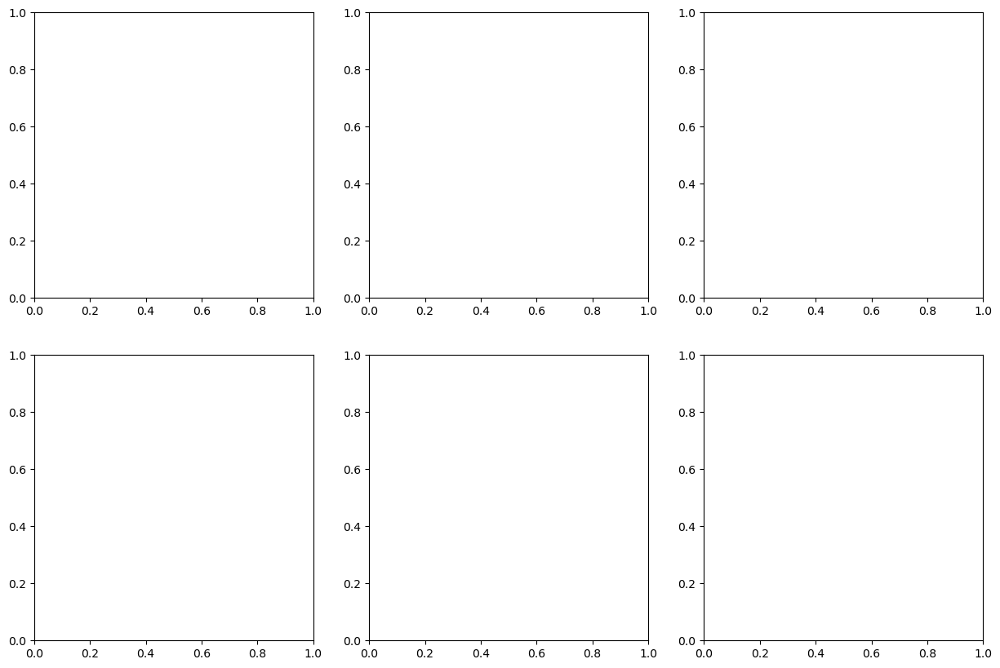

In [37]:
labels = [0, 1]   
for label in labels:    
    data = NormalizeData(dht_fdata[bin_labels==label].mean(axis=0).reshape(dht_fdata.shape[1], dht_fdata.shape[2]), axis=1)  # Your data array (shape: 64, 400)
    print(data.shape)
    fs = 200  # Sampling frequency (Hz)
    time = np.arange(data.shape[1]) / fs
    frequency = np.arange(0, data.shape[1]) * (fs / data.shape[1])

    # Frequencies of interest
    frequencies = [4, 8, 10, 12, 16, 20]

    # Create subplots
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))

    # Flatten axes for easy iteration
    axes = axes.flatten()

    # Plot topographic maps
    for i, f in enumerate(frequencies):
        ax = axes[i]
        #f_index = np.argmin(np.abs(frequency - f))
        f_index = int(jnp.argmax(frequency == f))
        topo_data = data[:, f_index].reshape(64,)
        
        mne.viz.plot_topomap(topo_data, info, axes=ax, sensors=True,
                            show=False, sphere=1.24, ch_type="eeg", contours=False, cmap='hsv_r') #names=ch_names
        ax.set_title(f'{f} Hz')

    plt.tight_layout()
    
    plt.show()

In [42]:
dht_fdata.shape

(1861, 64, 400, 1)

In [43]:
# Convert to NumPy arrays
#x_data = NormalizeData(jnp.array(df.drop(columns=['label'])), axis=1)
##x_data = NormalizeData(dht_fdata.reshape(dht_fdata.shape[0], dht_fdata.shape[1]*dht_fdata.shape[2]),axis=0)
x_data = NormalizeData(dht_fdata)
x_datar = x_data.reshape(x_data.shape[0], -1)
#x_data = dht_fdata.reshape(dht_fdata.shape[0], dht_fdata.shape[1]*dht_fdata.shape[2])
#labels = jnp.array(df['label'])

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x_datar, bin_labels, test_size=0.3, random_state=42, stratify=bin_labels)
print(x_train.shape, x_test.shape)
#x_train = x_train.reshape(x_train.shape[0], x_train.shape[1]//400, -1, 1)3
#x_test = x_test.reshape(x_test.shape[0], x_test.shape[1]//400, -1, 1)


(1302, 25600) (559, 25600)


In [45]:
model_svm = SVC(random_state=0, kernel='linear', C=10,)
model_svm.fit(x_train, y_train)

#predict on training set
y_train_pred = model_svm.predict(x_train)
print(classification_report(y_train, y_train_pred))

#predict on test set
y_test_pred = model_svm.predict(x_test)
print(classification_report(y_test, y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       652
           1       1.00      1.00      1.00       650

    accuracy                           1.00      1302
   macro avg       1.00      1.00      1.00      1302
weighted avg       1.00      1.00      1.00      1302

              precision    recall  f1-score   support

           0       0.47      0.47      0.48       280
           1       0.47      0.47      0.47       279

    accuracy                           0.47       559
   macro avg       0.47      0.47      0.47       559
weighted avg       0.47      0.47      0.47       559

